In [8]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
from tensorflow import keras
import itertools
from skimage import io, feature
from sklearn.model_selection import train_test_split
from sklearn import svm
import matplotlib.pyplot as plt
import pickle
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from tensorflow.keras.models import load_model
from skimage.measure import shannon_entropy
from PIL import Image
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
from mpl_toolkits.mplot3d import Axes3D
from sklearn.svm import SVC
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score, accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Flatten, Dense, Dropout,BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
from tensorflow.keras.optimizers import Adam

In [9]:
train_dir="/content/drive/MyDrive/NEU Metal Surface Defects Data/train"

In [10]:
test_dir="/content/drive/MyDrive/NEU Metal Surface Defects Data/test"

In [11]:
valid_dir="/content/drive/MyDrive/NEU Metal Surface Defects Data/valid"

In [12]:
# Path to the folder containing images
train_dir = "/content/drive/MyDrive/NEU Metal Surface Defects Data/train"
image_folder = train_dir

# Initialize lists to store results
dimensions = []
aspect_ratios = []
pixel_intensities = []
entropies = []
edge_percentages = []

# Function to calculate edge percentage
def edge_percentage(image):
    edges = cv2.Canny(image, 100, 200)
    return np.sum(edges > 0) / edges.size

# Loop through images in subfolders
for subfolder in os.listdir(image_folder):
    subfolder_path = os.path.join(image_folder, subfolder)

    if os.path.isdir(subfolder_path):
        for filename in os.listdir(subfolder_path):
            if filename.endswith((".bmp", ".jpg", ".png")):
                file_path = os.path.join(subfolder_path, filename)

                image = cv2.imread(file_path)
                if image is not None:
                    # Store dimensions
                    h, w, c = image.shape
                    dimensions.append((h, w, c))

                    # Aspect ratio
                    aspect_ratios.append(w / h)

                    # Grayscale
                    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

                    # Mean pixel intensity
                    pixel_intensities.append(np.mean(gray_image))

                    # Texture entropy
                    entropies.append(shannon_entropy(gray_image))

                    # Edge percentage
                    edge_percentages.append(edge_percentage(gray_image))

# Convert lists to NumPy arrays
dimensions = np.array(dimensions)
aspect_ratios = np.array(aspect_ratios)
pixel_intensities = np.array(pixel_intensities)
entropies = np.array(entropies)
edge_percentages = np.array(edge_percentages)


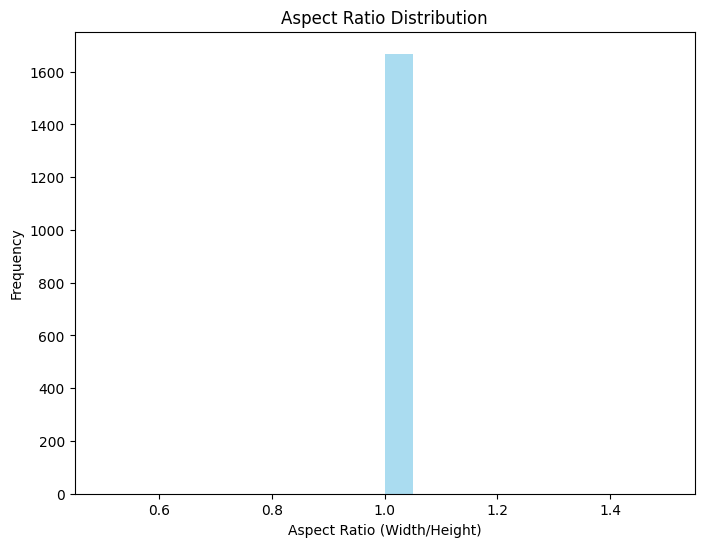

In [13]:
#  Aspect Ratios
plt.figure(figsize=(8, 6))
plt.hist(aspect_ratios, bins=20, color="skyblue", alpha=0.7)
plt.xlabel("Aspect Ratio (Width/Height)")
plt.ylabel("Frequency")
plt.title("Aspect Ratio Distribution")
plt.show()

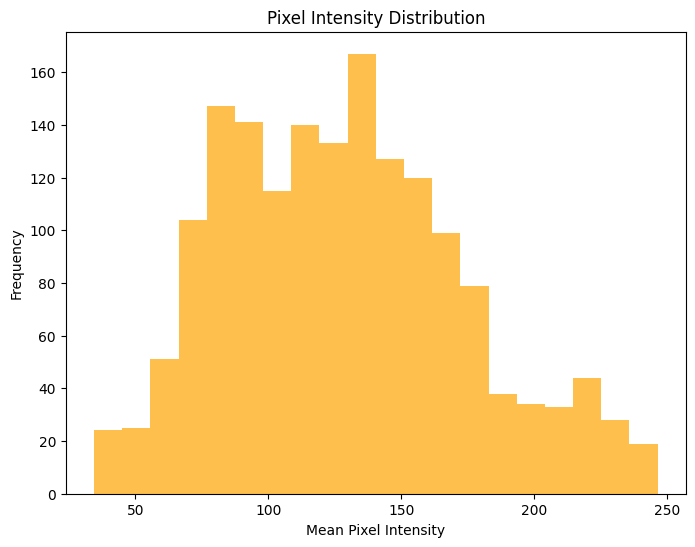

In [14]:
#  Pixel Intensity Distribution
plt.figure(figsize=(8, 6))
plt.hist(pixel_intensities, bins=20, color="orange", alpha=0.7)
plt.xlabel("Mean Pixel Intensity")
plt.ylabel("Frequency")
plt.title("Pixel Intensity Distribution")
plt.show()

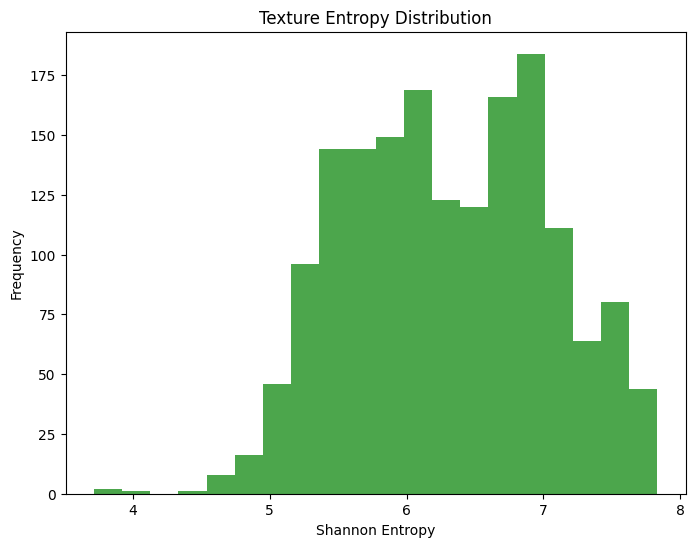

In [15]:
# Entropy (Texture Complexity)
plt.figure(figsize=(8, 6))
plt.hist(entropies, bins=20, color="green", alpha=0.7)
plt.xlabel("Shannon Entropy")
plt.ylabel("Frequency")
plt.title("Texture Entropy Distribution")
plt.show()

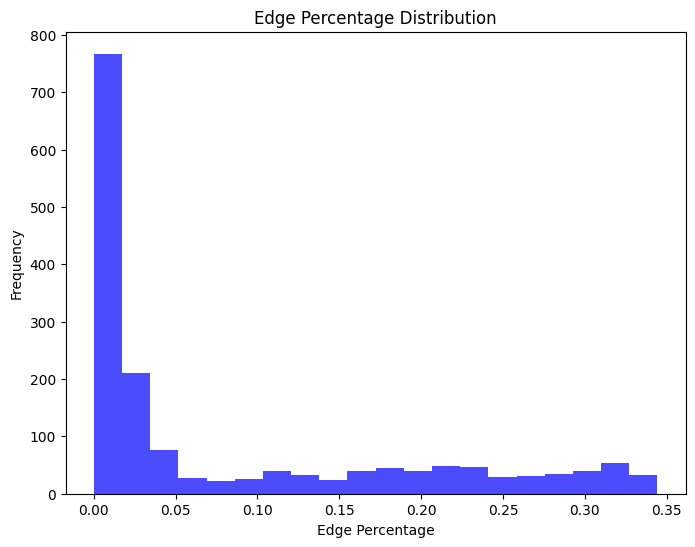

In [16]:
# Edge Percentage
plt.figure(figsize=(8, 6))
plt.hist(edge_percentages, bins=20, color="blue", alpha=0.7)
plt.xlabel("Edge Percentage")
plt.ylabel("Frequency")
plt.title("Edge Percentage Distribution")
plt.show()

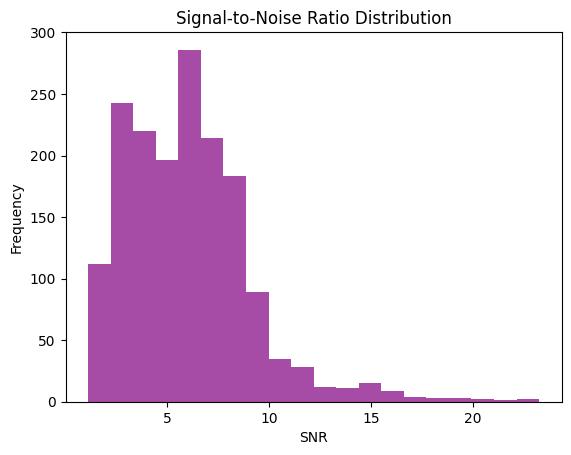

In [17]:
def calculate_snr(image):
    mean_signal = np.mean(image)
    noise = np.std(image)
    return mean_signal / noise

snr_values = []
for subfolder in os.listdir(image_folder):
    subfolder_path = os.path.join(image_folder, subfolder)
    if os.path.isdir(subfolder_path):
        for filename in os.listdir(subfolder_path):
            if filename.endswith((".bmp", ".jpg", ".png")):
                file_path = os.path.join(subfolder_path, filename)
                image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
                if image is not None:
                    snr_values.append(calculate_snr(image))

plt.hist(snr_values, bins=20, color='purple', alpha=0.7)
plt.title("Signal-to-Noise Ratio Distribution")
plt.xlabel("SNR")
plt.ylabel("Frequency")
plt.show()

In [18]:
train_datagen = ImageDataGenerator(rescale=1./255,
                             shear_range=0.2,
#                              zoom_range=0.2,
                             horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(train_dir,
                                              target_size=(200, 200),
                                              batch_size=36,
                                              class_mode='categorical',
                                                    shuffle = True
                                              )

valid_generator = test_datagen.flow_from_directory(valid_dir,
                                              target_size=(200, 200),
                                              batch_size=36,
                                              class_mode='categorical'
                                              )

test_generator = test_datagen.flow_from_directory(test_dir,
                                              target_size=(200, 200),
                                              batch_size=36,
                                              class_mode='categorical',
                                              shuffle = False
                                              )


Found 1668 images belonging to 6 classes.
Found 72 images belonging to 6 classes.
Found 72 images belonging to 6 classes.


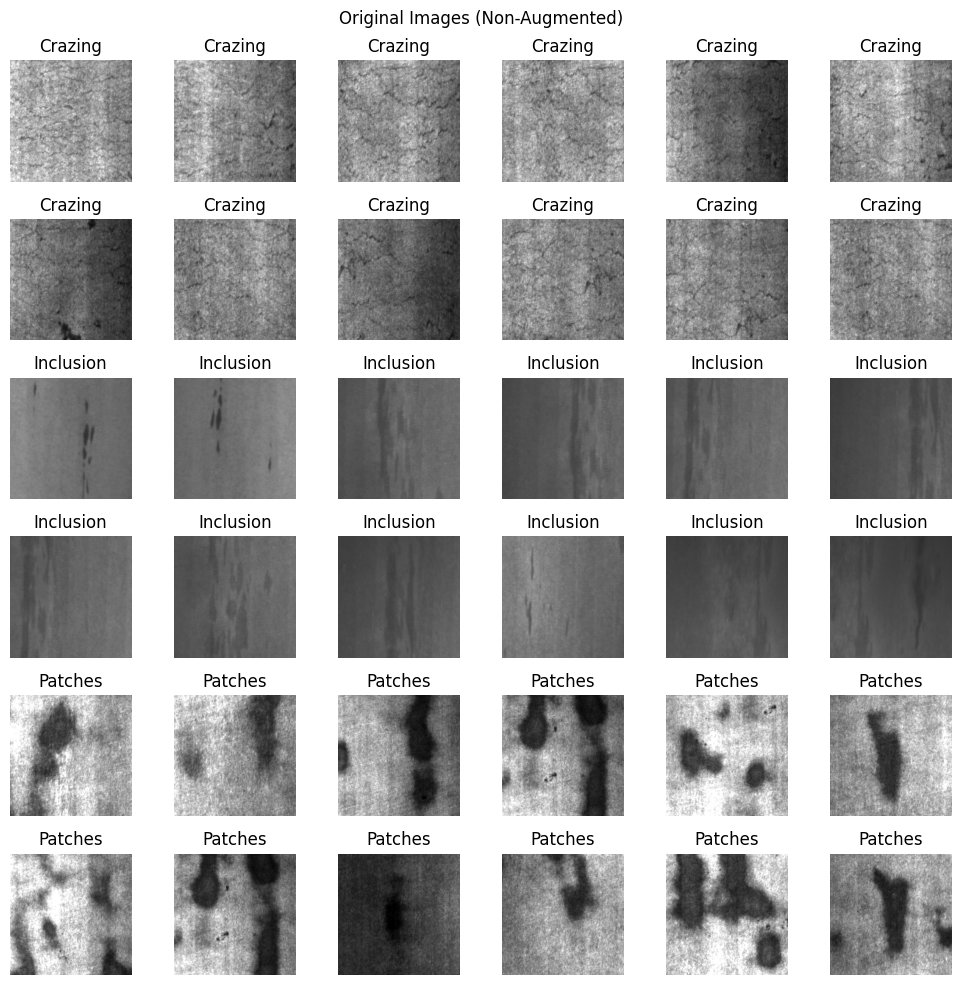

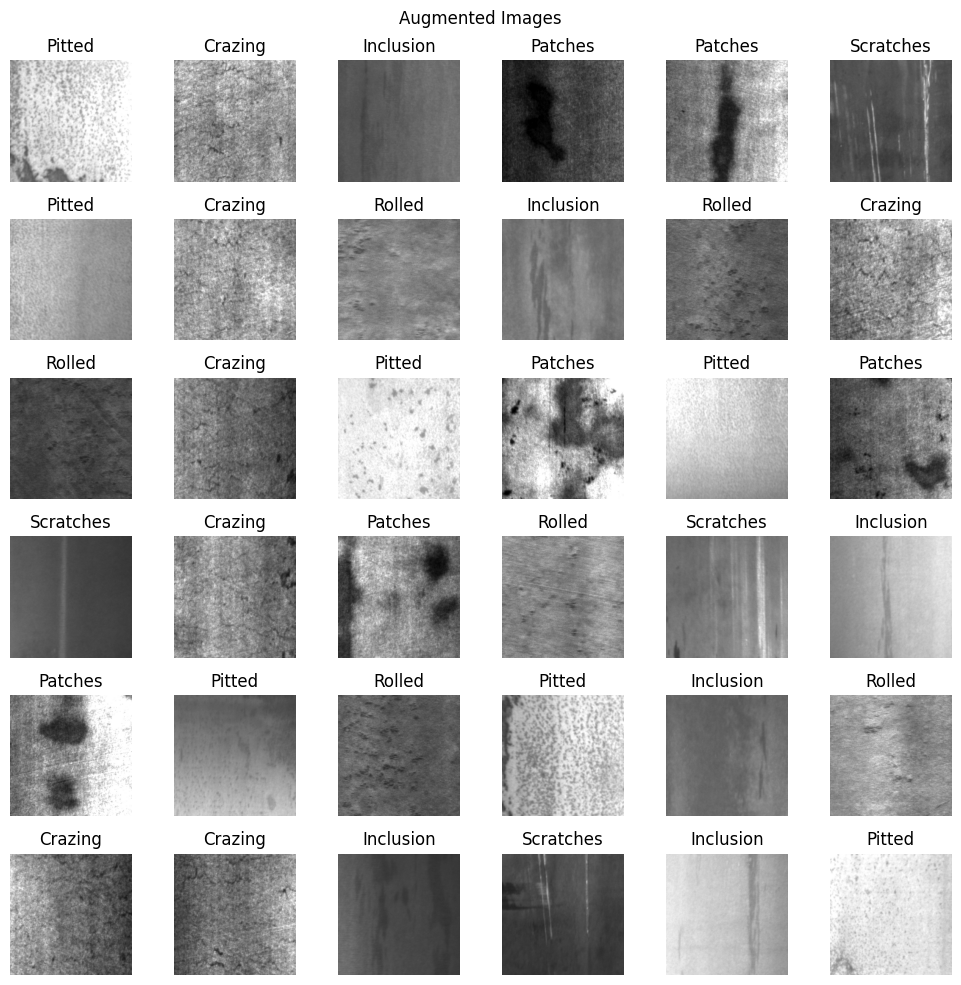

In [ ]:
# Function to display images in a grid
def plot_images(images, labels, title, class_indices):
    plt.figure(figsize=(10, 10))
    for i in range(len(images)):
        plt.subplot(6, 6, i + 1)  # Adjust grid size if necessary
        plt.imshow(images[i])
        plt.title(class_indices[labels[i]])
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Plot original (non-augmented) images
original_images, original_labels = next(test_generator)  # Load a batch of original images
original_images = original_images[:36]  # Limit to 36 images
original_labels = np.argmax(original_labels[:36], axis=1)  # Decode one-hot labels
class_indices = {v: k for k, v in test_generator.class_indices.items()}  # Decode class indices

plot_images(
    original_images,
    original_labels,
    title="Original Images (Non-Augmented)",
    class_indices=class_indices
)

# Plot augmented images
augmented_images, augmented_labels = next(train_generator)  # Load a batch of augmented images
augmented_images = augmented_images[:36]  # Limit to 36 images
augmented_labels = np.argmax(augmented_labels[:36], axis=1)  # Decode one-hot labels

plot_images(
    augmented_images,
    augmented_labels,
    title="Augmented Images",
    class_indices=class_indices
)


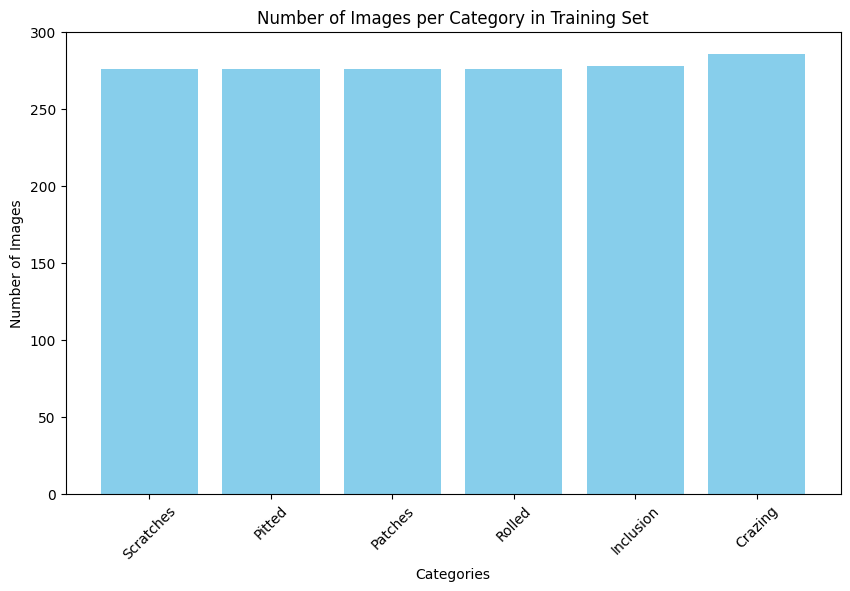

In [19]:
def count_images_per_category(directory):
    categories = os.listdir(directory)
    counts = Counter()

    for category in categories:
        category_path = os.path.join(directory, category)
        if os.path.isdir(category_path):
            num_images = len(os.listdir(category_path))
            counts[category] = num_images

    return counts

# Count the images in each category for the training set
train_counts = count_images_per_category(train_dir)
plt.figure(figsize=(10, 6))
plt.bar(train_counts.keys(), train_counts.values(), color='skyblue')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Number of Images per Category in Training Set')
plt.xticks(rotation=45)
plt.show()

In [20]:
for image_batch, labels_batch in train_generator:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(36, 200, 200, 3)
(36, 6)


In [21]:
def get_sample_image(generator):
    images, labels = next(generator)
    image = images[0]
    label_index = np.argmax(labels[0])
    class_names=list(train_generator.class_indices.keys())
    label_name = class_names[label_index]

    return image, label_name


def sample_images(generator, nrows=4, ncols=4):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15))

    for i in range(nrows*ncols):
        image, label_name = get_sample_image(generator)
        row = i // ncols
        col = i % ncols
        ax = axes[row][col]
#         ax.imshow(image , cmap='gray_r')
        ax.imshow(image)
        ax.set_title(label_name)
        ax.axis('off')

    plt.show()

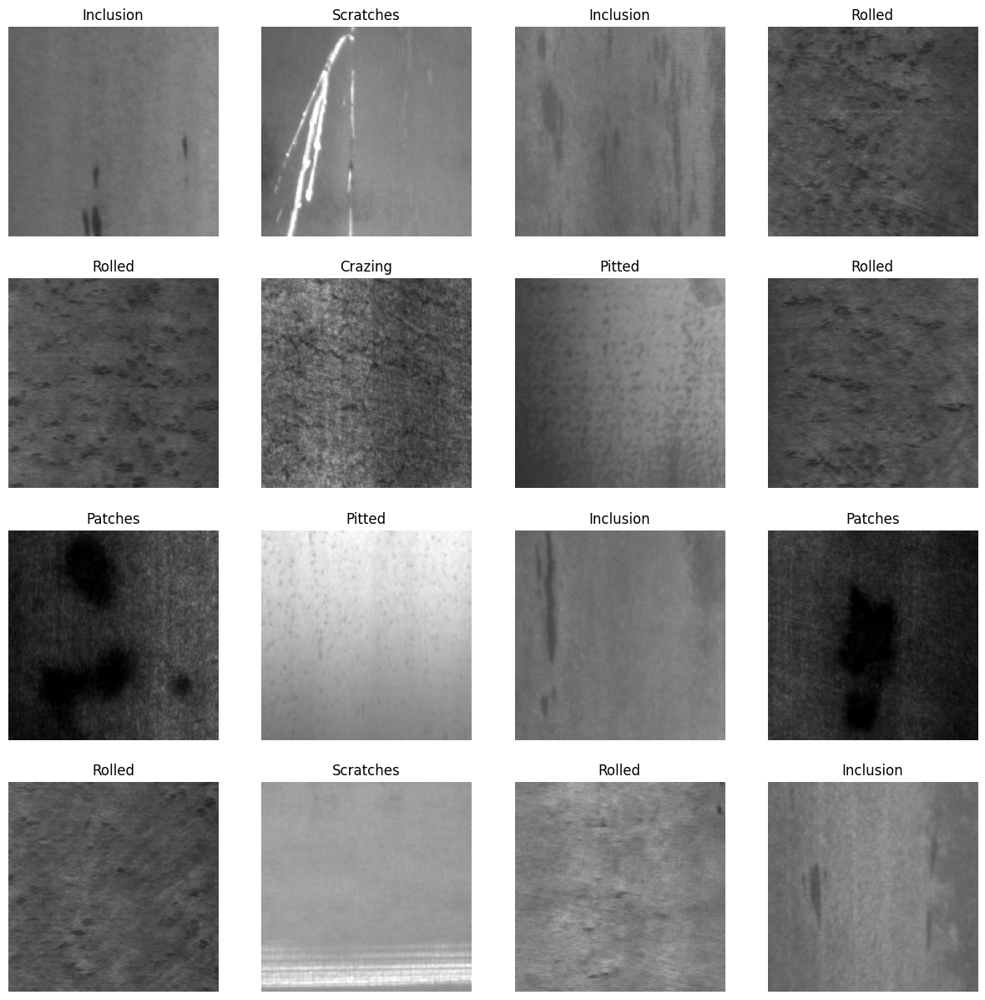

In [22]:
sample_images(train_generator, nrows=4, ncols=4)

In [23]:
def extract_features(generator):
    features = []
    labels = []
    batches_processed = 0

    for inputs_batch, labels_batch in generator:
        features.append(inputs_batch)
        labels.append(labels_batch)
        batches_processed += 1

        # Check if all samples have been processed
        if batches_processed * generator.batch_size >= generator.samples:
            break

    # Stack features and labels
    features = np.vstack(features)
    labels = np.vstack(labels)

    print(f"Processed {batches_processed} batches.")
    print(f"Total features shape: {features.shape}")
    print(f"Total labels shape: {labels.shape}")

    return features, labels

# Extract features and labels from generators
train_features, train_labels = extract_features(train_generator)
validation_features, validation_labels = extract_features(valid_generator)
test_features, test_labels = extract_features(test_generator)

# Flatten the features for PCA and t-SNE
num_samples, height, width, channels = train_features.shape
flattened_features = train_features.reshape(num_samples, height * width * channels)

print(f"Shape of flattened_features: {flattened_features.shape}")
print(f"Shape of train_labels: {train_labels.shape}")

Processed 47 batches.
Total features shape: (1668, 200, 200, 3)
Total labels shape: (1668, 6)
Processed 2 batches.
Total features shape: (72, 200, 200, 3)
Total labels shape: (72, 6)
Processed 2 batches.
Total features shape: (72, 200, 200, 3)
Total labels shape: (72, 6)
Shape of flattened_features: (1668, 120000)
Shape of train_labels: (1668, 6)


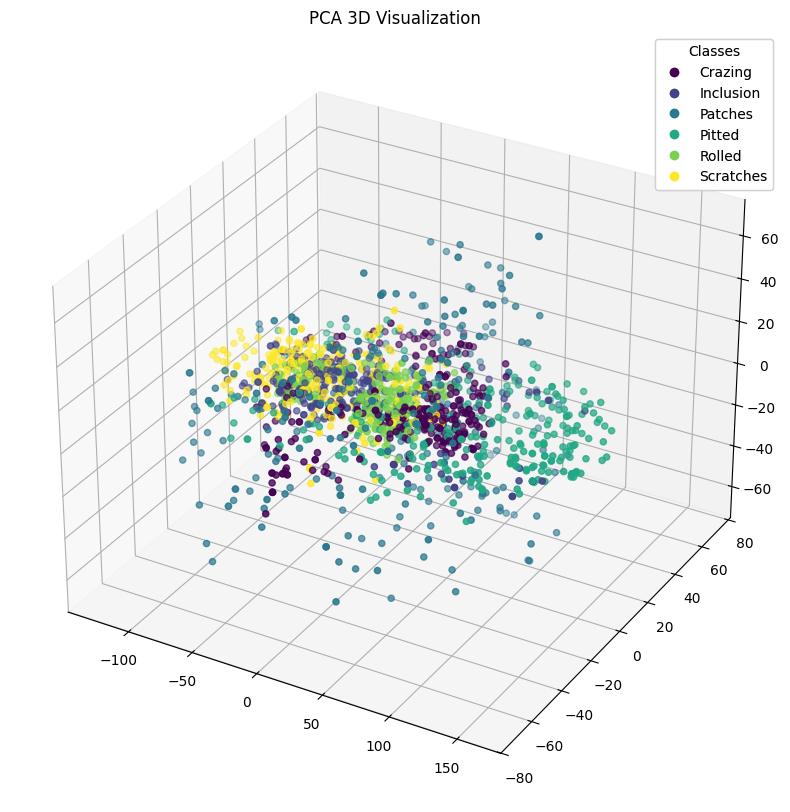

In [24]:
# PCA for 3D
class_names=list(train_generator.class_indices.keys())

pca = PCA(n_components=3)
reduced_features_3d = pca.fit_transform(flattened_features)

fig = plt.figure(figsize= (10,10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(reduced_features_3d[:, 0], reduced_features_3d[:, 1], reduced_features_3d[:, 2], c=np.argmax(train_labels, axis=1), cmap='viridis')
# legend = ax.legend(*scatter.legend_elements(), title="Classes")
# ax.add_artist(legend)
handles, _ = scatter.legend_elements()
legend = ax.legend(handles, class_names, title="Classes")
ax.add_artist(legend)
plt.title('PCA 3D Visualization')
plt.show()

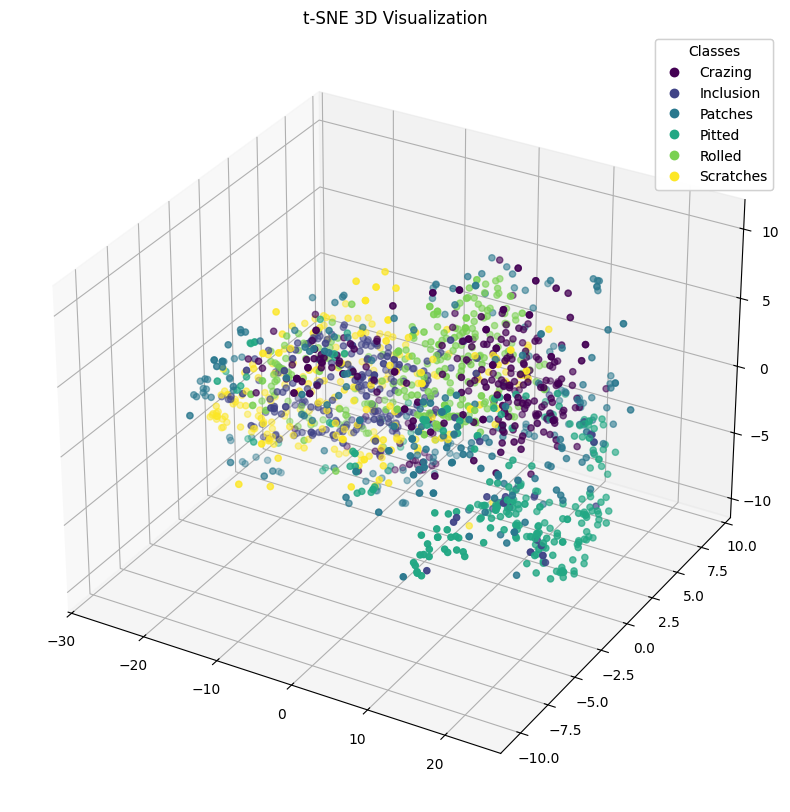

In [25]:
# t-SNE for 3D
tsne = TSNE(n_components=3, random_state=42)
tsne_features_3d = tsne.fit_transform(flattened_features)

fig = plt.figure(figsize= (10,10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(tsne_features_3d[:, 0], tsne_features_3d[:, 1], tsne_features_3d[:, 2], c=np.argmax(train_labels, axis=1), cmap='viridis')
# legend = ax.legend(*scatter.legend_elements(), title="Classes")
# ax.add_artist(legend)
handles, _ = scatter.legend_elements()
legend = ax.legend(handles, class_names, title="Classes")
ax.add_artist(legend)
plt.title('t-SNE 3D Visualization')
plt.show()

In [26]:
# Model layers
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)),
#     BatchNormalization(),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
#     BatchNormalization(),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
#     BatchNormalization(),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
#     Dense(64, activation='relu'),
#     Dropout(0.3),
    Dense(6 ,activation='softmax')
])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [27]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 198, 198, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 99, 99, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 97, 97, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 46, 46, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 23, 23, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 67712)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │    17,334,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,429,318 (66.49 MB)

 Trainable params: 17,429,318 (66.49 MB)

 Non-trainable params: 0 (0.00 B)

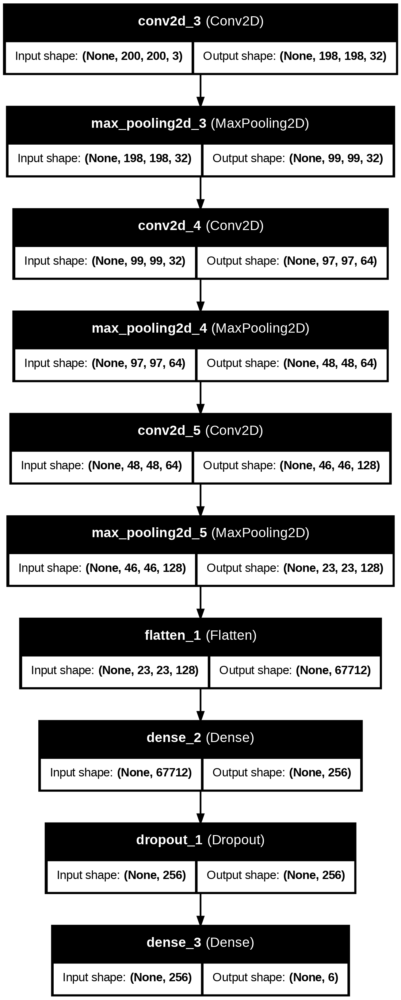

In [28]:
plot_model(model, to_file="model_architecture.png", show_shapes=True, show_layer_names=True)

In [29]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

checkpoint_cb = ModelCheckpoint(
    filepath='second/model_checkpoint_final5.h5',
    save_best_only=True,
    monitor='val_loss',
    mode='min',
    verbose=1
)

# Early stopping callback to stop training when validation loss stops improving
early_stopping_cb = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate when a metric has stopped improving
reduce_lr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=5,
    min_lr=0.0001,
    verbose=1
)
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# List of callbacks
callbacks = [checkpoint_cb, early_stopping_cb, reduce_lr_cb]

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

valid_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/NEU Metal Surface Defects Data/train',   # CHANGE to your path
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

valid_generator = valid_datagen.flow_from_directory(
    '/content/drive/MyDrive/NEU Metal Surface Defects Data/valid',   # CHANGE to your path
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)


# Train the model with callbacks
history = model.fit(
    train_generator,
    epochs=25,
    validation_data=valid_generator,
    callbacks=callbacks
)

Found 1668 images belonging to 6 classes.
Found 72 images belonging to 6 classes.


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.1761 - loss: -293862.9375
Epoch 1: val_loss improved from inf to -16232494.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 34s 582ms/step - accuracy: 0.1759 - loss: -323077.7188 - val_accuracy: 0.1667 - val_loss: -16232494.0000 - learning_rate: 0.0010
Epoch 2/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.1766 - loss: -95464896.0000
Epoch 2: val_loss improved from -16232494.00000 to -1328907136.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 515ms/step - accuracy: 0.1764 - loss: -99196056.0000 - val_accuracy: 0.1667 - val_loss: -1328907136.0000 - learning_rate: 0.0010
Epoch 3/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 501ms/step - accuracy: 0.1600 - loss: -2932932608.0000
Epoch 3: val_loss improved from -1328907136.00000 to -19163344896.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 517ms/step - accuracy: 0.1602 - loss: -2992993536.0000 - val_accuracy: 0.1667 - val_loss: -19163344896.0000 - learning_rate: 0.0010
Epoch 4/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.1748 - loss: -29178820608.0000
Epoch 4: val_loss improved from -19163344896.00000 to -120569823232.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 531ms/step - accuracy: 0.1747 - loss: -29532366848.0000 - val_accuracy: 0.1667 - val_loss: -120569823232.0000 - learning_rate: 0.0010
Epoch 5/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.1615 - loss: -159968231424.0000
Epoch 5: val_loss improved from -120569823232.00000 to -472060887040.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 515ms/step - accuracy: 0.1616 - loss: -161145634816.0000 - val_accuracy: 0.1667 - val_loss: -472060887040.0000 - learning_rate: 0.0010
Epoch 6/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step - accuracy: 0.1621 - loss: -546824781824.0000
Epoch 6: val_loss improved from -472060887040.00000 to -1417734651904.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 515ms/step - accuracy: 0.1622 - loss: -550177669120.0000 - val_accuracy: 0.1667 - val_loss: -1417734651904.0000 - learning_rate: 0.0010
Epoch 7/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 510ms/step - accuracy: 0.1650 - loss: -1588229963776.0000
Epoch 7: val_loss improved from -1417734651904.00000 to -3496952725504.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 528ms/step - accuracy: 0.1651 - loss: -1594924204032.0000 - val_accuracy: 0.1667 - val_loss: -3496952725504.0000 - learning_rate: 0.0010
Epoch 8/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step - accuracy: 0.1661 - loss: -3905888452608.0000
Epoch 8: val_loss improved from -3496952725504.00000 to -7432418885632.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 501ms/step - accuracy: 0.1661 - loss: -3915680579584.0000 - val_accuracy: 0.1667 - val_loss: -7432418885632.0000 - learning_rate: 0.0010
Epoch 9/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step - accuracy: 0.1614 - loss: -7788563529728.0000
Epoch 9: val_loss improved from -7432418885632.00000 to -14321890361344.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 510ms/step - accuracy: 0.1615 - loss: -7809764163584.0000 - val_accuracy: 0.1667 - val_loss: -14321890361344.0000 - learning_rate: 0.0010
Epoch 10/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step - accuracy: 0.1587 - loss: -13178284015616.0000
Epoch 10: val_loss improved from -14321890361344.00000 to -25474036137984.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 503ms/step - accuracy: 0.1589 - loss: -13238734422016.0000 - val_accuracy: 0.1667 - val_loss: -25474036137984.0000 - learning_rate: 0.0010
Epoch 11/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step - accuracy: 0.1517 - loss: -26102462414848.0000
Epoch 11: val_loss improved from -25474036137984.00000 to -43091360743424.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 488ms/step - accuracy: 0.1520 - loss: -26151539965952.0000 - val_accuracy: 0.1667 - val_loss: -43091360743424.0000 - learning_rate: 0.0010
Epoch 12/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.1355 - loss: -40529999953920.0000
Epoch 12: val_loss improved from -43091360743424.00000 to -67875561799680.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 29s 533ms/step - accuracy: 0.1361 - loss: -40642222751744.0000 - val_accuracy: 0.1667 - val_loss: -67875561799680.0000 - learning_rate: 0.0010
Epoch 13/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.1599 - loss: -62852899536896.0000
Epoch 13: val_loss improved from -67875561799680.00000 to -103901843947520.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 491ms/step - accuracy: 0.1600 - loss: -63021640581120.0000 - val_accuracy: 0.1667 - val_loss: -103901843947520.0000 - learning_rate: 0.0010
Epoch 14/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.1652 - loss: -98708767113216.0000
Epoch 14: val_loss improved from -103901843947520.00000 to -151885059194880.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 493ms/step - accuracy: 0.1652 - loss: -98869752889344.0000 - val_accuracy: 0.1667 - val_loss: -151885059194880.0000 - learning_rate: 0.0010
Epoch 15/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.1740 - loss: -140952756813824.0000
Epoch 15: val_loss improved from -151885059194880.00000 to -216719335358464.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 524ms/step - accuracy: 0.1738 - loss: -141202670223360.0000 - val_accuracy: 0.1667 - val_loss: -216719335358464.0000 - learning_rate: 0.0010
Epoch 16/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step - accuracy: 0.1728 - loss: -202628453629952.0000
Epoch 16: val_loss improved from -216719335358464.00000 to -301679207514112.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 509ms/step - accuracy: 0.1726 - loss: -202924235948032.0000 - val_accuracy: 0.1667 - val_loss: -301679207514112.0000 - learning_rate: 0.0010
Epoch 17/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step - accuracy: 0.1623 - loss: -277146052329472.0000
Epoch 17: val_loss improved from -301679207514112.00000 to -409883090354176.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 26s 495ms/step - accuracy: 0.1624 - loss: -277608767946752.0000 - val_accuracy: 0.1667 - val_loss: -409883090354176.0000 - learning_rate: 0.0010
Epoch 18/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.1656 - loss: -353775248211968.0000
Epoch 18: val_loss improved from -409883090354176.00000 to -541107830128640.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 529ms/step - accuracy: 0.1656 - loss: -354665212411904.0000 - val_accuracy: 0.1667 - val_loss: -541107830128640.0000 - learning_rate: 0.0010
Epoch 19/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step - accuracy: 0.1491 - loss: -509255547355136.0000
Epoch 19: val_loss improved from -541107830128640.00000 to -707362591604736.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 510ms/step - accuracy: 0.1494 - loss: -509565456089088.0000 - val_accuracy: 0.1667 - val_loss: -707362591604736.0000 - learning_rate: 0.0010
Epoch 20/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 505ms/step - accuracy: 0.1674 - loss: -594807269359616.0000
Epoch 20: val_loss improved from -707362591604736.00000 to -905648011214848.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 520ms/step - accuracy: 0.1674 - loss: -596493312458752.0000 - val_accuracy: 0.1667 - val_loss: -905648011214848.0000 - learning_rate: 0.0010
Epoch 21/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 514ms/step - accuracy: 0.1717 - loss: -789896427995136.0000
Epoch 21: val_loss improved from -905648011214848.00000 to -1146123699879936.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 528ms/step - accuracy: 0.1716 - loss: -791517442605056.0000 - val_accuracy: 0.1667 - val_loss: -1146123699879936.0000 - learning_rate: 0.0010
Epoch 22/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.1581 - loss: -1059483069448192.0000
Epoch 22: val_loss improved from -1146123699879936.00000 to -1432233617391616.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 508ms/step - accuracy: 0.1583 - loss: -1059905184202752.0000 - val_accuracy: 0.1667 - val_loss: -1432233617391616.0000 - learning_rate: 0.0010
Epoch 23/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step - accuracy: 0.1557 - loss: -1310481092444160.0000
Epoch 23: val_loss improved from -1432233617391616.00000 to -1770360018042880.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 509ms/step - accuracy: 0.1559 - loss: -1311354849853440.0000 - val_accuracy: 0.1667 - val_loss: -1770360018042880.0000 - learning_rate: 0.0010
Epoch 24/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 503ms/step - accuracy: 0.1699 - loss: -1585245451190272.0000
Epoch 24: val_loss improved from -1770360018042880.00000 to -2153083077394432.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 28s 517ms/step - accuracy: 0.1698 - loss: -1586918072516608.0000 - val_accuracy: 0.1667 - val_loss: -2153083077394432.0000 - learning_rate: 0.0010
Epoch 25/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.1652 - loss: -1957457517608960.0000
Epoch 25: val_loss improved from -2153083077394432.00000 to -2614553019940864.00000, saving model to second/model_checkpoint_final5.h5


53/53 ━━━━━━━━━━━━━━━━━━━━ 27s 502ms/step - accuracy: 0.1653 - loss: -1958729499017216.0000 - val_accuracy: 0.1667 - val_loss: -2614553019940864.0000 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 25.


In [34]:
model.summary()





Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,507,269 (127.82 MB)

 Trainable params: 11,169,089 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 22,338,180 (85.21 MB)

In [51]:
from tensorflow.keras.models import load_model, Model


best_model5 = load_model('second/model_checkpoint_final5.h5')

best_model5.build((None, 224, 224, 3))





In [47]:
best_model5.layers[-3]


<Dense name=dense_4, built=True>

In [55]:
# t-SNE for 3D
tsne = TSNE(n_components=3, random_state=42)
tsne_features_3d = tsne.fit_transform(X_features)

fig = plt.figure(figsize= (10,10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(tsne_features_3d[:, 0], tsne_features_3d[:, 1], tsne_features_3d[:, 2], c=np.argmax(train_labels, axis=1), cmap='viridis')
# legend = ax.legend(*scatter.legend_elements(), title="Classes")
# ax.add_artist(legend)
handles, _ = scatter.legend_elements()
legend = ax.legend(handles, class_names, title="Classes")
ax.add_artist(legend)
plt.title('t-SNE 3D Visualization')
plt.show()

NameError: name 'X_features' is not defined

In [56]:
# Define a new model to extract feature maps from the convolutional layers
layer_outputs = [layer.output for layer in best_model5.layers[:6]]  # Extract outputs from the first 6 layers (conv + pooling)
feature_map_model = Model(inputs=best_model5.input, outputs=layer_outputs)

# Select a misclassified image
# misclassified_index = misclassified_indices[0]  # Choose the first misclassified image
img_path = test_generator.filepaths[69]
img = plt.imread(img_path)

# Check the image shape
print("Original image shape:", img.shape)  # Should be (200, 200, 3) for RGB or (200, 200) for grayscale

# If the image is grayscale (2D), convert it to RGB (3D)
if len(img.shape) == 2:
    img = np.stack((img,) * 3, axis=-1)  # Convert grayscale to RGB by repeating the channel

# Add batch dimension and normalize pixel values
img = np.expand_dims(img, axis=0)  # Shape: (1, 200, 200, 3)
img = img / 255.0  # Normalize pixel values (if not already done)

# Get the feature maps for the misclassified image
feature_maps = feature_map_model.predict(img)

# Visualize the feature maps
layer_names = [layer.name for layer in best_model5.layers[:6]]  # Names of the first 6 layers

for layer_name, feature_map in zip(layer_names, feature_maps):
    if len(feature_map.shape) == 4:  # Check if the layer output is a feature map (4D tensor)
        num_filters = feature_map.shape[-1]  # Number of filters in the layer
        size = feature_map.shape[1]  # Size of the feature map (width/height)

        # Display the feature maps in a grid
        display_grid = np.zeros((size, size * num_filters))

        for i in range(num_filters):
            # Post-process each filter to make it visually interpretable
#             x = feature_map[0, :, :, i]
            x = feature_map[0, :, :, i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x, 0, 255).astype('uint8')

            # Place each filter in the grid
            display_grid[:, i * size : (i + 1) * size] = x

        # Plot the feature maps
        scale = 20. / num_filters
#         plt.figure(figsize=(16, 2))
        plt.figure(figsize=(scale * num_filters, scale))
        plt.title(f"Feature maps for {layer_name}")
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.show()

AttributeError: The layer sequential_2 has never been called and thus has no defined input.

In [8]:
# Define a new model to extract feature maps from the convolutional layers
layer_outputs = [layer.output for layer in best_model5.layers[:6]]  # Extract outputs from the first 6 layers (conv + pooling)
feature_map_model = Model(inputs=best_model5.input, outputs=layer_outputs)

# Select a misclassified image
# misclassified_index = misclassified_indices[0]  # Choose the first misclassified image
img_path = test_generator.filepaths[69]
img = plt.imread(img_path)

# Check the image shape
print("Original image shape:", img.shape)  # Should be (200, 200, 3) for RGB or (200, 200) for grayscale

# If the image is grayscale (2D), convert it to RGB (3D)
if len(img.shape) == 2:
    img = np.stack((img,) * 3, axis=-1)  # Convert grayscale to RGB by repeating the channel

# Add batch dimension and normalize pixel values
img = np.expand_dims(img, axis=0)  # Shape: (1, 200, 200, 3)
img = img / 255.0  # Normalize pixel values (if not already done)

# Get the feature maps for the misclassified image
feature_maps = feature_map_model.predict(img)

# Visualize the feature maps
layer_names = [layer.name for layer in best_model5.layers[:6]]  # Names of the first 6 layers

for layer_name, feature_map in zip(layer_names, feature_maps):
    if len(feature_map.shape) == 4:  # Check if the layer output is a feature map (4D tensor)
        num_filters = 16  # Number of filters in the layer
        size = feature_map.shape[1]  # Size of the feature map (width/height)

        # Display the feature maps in a grid
        display_grid = np.zeros((size, size * num_filters))

        for i in range(num_filters):
            # Post-process each filter to make it visually interpretable
#             x = feature_map[0, :, :, i]
            x = feature_map[0, :, :, i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x, 0, 255).astype('uint8')

            # Place each filter in the grid
            display_grid[:, i * size : (i + 1) * size] = x

        # Plot the feature maps
        scale = 20. / num_filters
#         plt.figure(figsize=(16, 2))
        plt.figure(figsize=(scale * num_filters, scale))
        plt.title(f"Feature maps for {layer_name}")
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.show()

NameError: name 'best_model5' is not defined

In [9]:
def plot_history(history, metric):
    plt.plot(history.history[metric])
    plt.plot(history.history['val_'+metric], '')
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend([metric, 'val_'+metric])
    plt.show()

In [10]:
# plot_history(history, 'accuracy')
plot_history(history, 'loss')

NameError: name 'history' is not defined

In [11]:
result = best_model5.evaluate(test_generator)
print("Test loss, Test accuracy : ", result)

NameError: name 'best_model5' is not defined

In [12]:
# Generate predictions on the test data
test_generator.reset()  # Ensure the generator starts from the beginning
predictions = best_model5.predict(test_generator, steps=test_generator.n // test_generator.batch_size + 1)
predicted_classes = np.argmax(predictions, axis=1)  # Convert probabilities to class predictions
true_classes = test_generator.classes  # True labels
class_labels = list(test_generator.class_indices.keys())  # Class names

# Step 2: Classification Report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("Classification Report:")
print(report)

NameError: name 'test_generator' is not defined

In [13]:
images, labels = next(test_generator)

indices = np.random.choice(range(len(images)), size=24)
images = images[indices]
labels = labels[indices]

predictions = best_model5.predict(images)


class_names=list(test_generator.class_indices.keys())


plt.figure(figsize=(16,16))

for i in range(24):
    plt.subplot(6,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    image = images[i]

    if image.shape[-1] == 1:
        image = np.squeeze(image)

    plt.imshow(image)

    predicted_label = np.argmax(predictions[i])

    if predicted_label == np.argmax(labels[i]):
        color='blue'
        result_text="Correct"

    else:
        color='red'
        result_text="Incorrect"

    label_text="True: "+ class_names[np.argmax(labels[i])] + ", Pred: " + class_names[predicted_label] + f" ({result_text})"

    plt.xlabel(label_text,color=color)

NameError: name 'test_generator' is not defined

In [14]:
# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Make predictions
predictions = best_model5.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes

# Find misclassified images
misclassified_indices = np.where(predicted_classes != true_classes)[0]

# Display some misclassified images
num_images = min(10, len(misclassified_indices))  # Show up to 10 images
plt.figure(figsize=(18, 9))

for i, index in enumerate(misclassified_indices[:num_images]):
    img_path = test_generator.filepaths[index]
    img = plt.imread(img_path)

    true_label = class_labels[true_classes[index]]
    pred_label = class_labels[predicted_classes[index]]

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=10, color="red")

plt.tight_layout()
plt.show()


NameError: name 'test_generator' is not defined

In [15]:
# Find misclassified images
misclassified_indices = np.where(true_classes != predicted_classes)[0]

# Display some misclassified images
num_images = min(10, len(misclassified_indices))  # Show up to 10 images
plt.figure(figsize=(12, 6))

for i, index in enumerate(misclassified_indices[:num_images]):
    img_path = test_generator.filepaths[index]
    img = plt.imread(img_path)

    true_label = class_labels[true_classes[index]]
    pred_label = class_labels[predicted_classes[index]]

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"True: {true_label}\nPred: {pred_label}", fontsize=10, color="red")

plt.tight_layout()
plt.show()


NameError: name 'np' is not defined

In [16]:
## delete these if does not worksimport numpy as np

# Extract features for test data
feature_model = Model(inputs=best_model5.input, outputs=best_model5.layers[-2].output)
X_test_features = feature_model.predict(test_generator)

# Apply PCA to reduce features to 2D
pca = PCA(n_components=2)
reduced_features_2d = pca.fit_transform(X_test_features)

# Identify misclassified points
misclassified_indices = np.where(predicted_classes != true_classes)[0]

# Plot PCA visualization
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_features_2d[:, 0], reduced_features_2d[:, 1], c=true_classes, cmap='viridis', alpha=0.6, label="Correctly Classified")
plt.scatter(reduced_features_2d[misclassified_indices, 0],
            reduced_features_2d[misclassified_indices, 1],
            c='red', edgecolors='k', marker='x', s=100, label="Misclassified")

# Add legend and labels
plt.legend()
plt.colorbar(label="True Class Labels")
plt.title("PCA 2D Visualization of Test Data (Misclassified Points in Red)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

NameError: name 'Model' is not defined

In [17]:


# Extract features for test data
feature_model = Model(inputs=best_model5.input, outputs=best_model5.layers[-2].output)
X_test_features = feature_model.predict(test_generator)

# Apply t-SNE for 2D visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
reduced_features_tsne = tsne.fit_transform(X_test_features)

# Identify misclassified points
misclassified_indices = np.where(predicted_classes != true_classes)[0]

# Plot t-SNE visualization
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced_features_tsne[:, 0], reduced_features_tsne[:, 1], c=true_classes, cmap='viridis', alpha=0.6, label="Correctly Classified")

# Highlight misclassified images in red
plt.scatter(reduced_features_tsne[misclassified_indices, 0],
            reduced_features_tsne[misclassified_indices, 1],
            c='red', edgecolors='k', marker='x', s=100, label="Misclassified")

# Add legend and labels
plt.legend()
plt.colorbar(label="True Class Labels")
plt.title("t-SNE 2D Visualization of Test Data (Misclassified Points in Red)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()


NameError: name 'Model' is not defined

In [64]:
predictions = best_model5.predict(test_generator, verbose=1)

# Step 2: Convert Predictions to Class Labels
predicted_classes = np.argmax(predictions, axis=1)  # Get class with the highest probability
true_classes = test_generator.classes  # True labels from the generator
class_labels = list(test_generator.class_indices.keys())  # Class names

# Step 3: Generate Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Step 4: Display Confusion Matrix as Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "dense_4" is incompatible with the layer: expected axis -1 of input shape to have value 86528, but received input with shape (36, 67712)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(36, 200, 200, 3), dtype=float32)
  • training=False
  • mask=None
  • kwargs=<class 'inspect._empty'>

In [ ]:
def produce_image_labels(dir):
    # Loop through each subdirectory in the root directory
    # Lists to store the features and labels
    images = []
    labels = []
    list_dir = os.listdir(dir)
    for subdirectory in list_dir:
        # Check if it is a subdirectory
        if os.path.isdir(os.path.join(dir, subdirectory)):
            # Get the full path to the subdirectory
            subdirectory_path = os.path.join(dir, subdirectory)

            # Loop through each image in the subdirectory
            for image_name in os.listdir(subdirectory_path):
            # Get the full path to the image
                image_path = os.path.join(subdirectory_path, image_name)

                # Load the image
                image = io.imread(image_path)

                # Apply HOG (Histogram of Oriented Gradients) to extract features
                features_hog, _ = feature.hog(image, visualize=True)

                # Add the features and label to the lists
                images.append(features_hog)
                labels.append(subdirectory)

    # Convert the lists to NumPy arrays
    images = np.array(images)
    labels = np.array(labels)
    return images,labels

train_images ,train_labels = produce_image_labels(train_dir)
print("Done")
val_images ,val_labels = produce_image_labels(valid_dir)
print("Done")
test_images ,test_labels = produce_image_labels(test_dir)

In [ ]:
combined_images = np.concatenate([train_images, val_images])
combined_labels = np.concatenate([train_labels, val_labels])

In [ ]:
# Train SVM on the combined data
svm_model_final = SVC(kernel='rbf', gamma='scale', C=1.0)
svm_model_final.fit(combined_images, combined_labels)


In [63]:
test_predictions = svm_model_final.predict(test_images)
test_accuracy = accuracy_score(test_labels, test_predictions)

# print(f'Validation Accuracy: {validation_accuracy}')
print(f'Test Accuracy: {test_accuracy}')

NameError: name 'svm_model_final' is not defined

In [ ]:
class_names=list(test_generator.class_indices.keys())
# Calculate the confusion matrix
svm_confusion_matrix = confusion_matrix(test_labels, test_predictions)

# Function to plot the confusion matrix
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
plot_confusion_matrix(svm_confusion_matrix, class_names)
plt.show()

In [61]:
# Define hyperparameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Grid search
rf_model = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(combined_images, combined_labels)

# Best parameters
print("Best Hyperparameters:", grid_search.best_params_)
best_rf_model = grid_search.best_estimator_

NameError: name 'combined_images' is not defined

In [62]:
rf_model_2 = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    min_samples_split=10,
    min_samples_leaf=2,
    max_features='sqrt',
    random_state=42
)
rf_model_2.fit(train_images, train_labels)

# Evaluate
test_predictions_rf = rf_model_2.predict(test_images)
test_accuracy = accuracy_score(test_labels, test_predictions)
print(f"Test Accuracy: {test_accuracy}")

NameError: name 'train_images' is not defined

In [60]:
# Plot the Random Forest confusion matrix
confusion_matrix_rf = confusion_matrix(test_labels, test_predictions_rf)

plt.figure(figsize=(8, 6))
plot_confusion_matrix(confusion_matrix_rf, class_names)
plt.title('Confusion Matrix - Random Forest')
plt.show()

NameError: name 'test_predictions_rf' is not defined

In [59]:
accuracy_cnn = accuracy_score(true_classes, predicted_classes)
precision_cnn = precision_score(true_classes, predicted_classes, average='weighted')
recall_cnn = recall_score(true_classes, predicted_classes, average='weighted')
f1_cnn = f1_score(true_classes, predicted_classes, average='weighted')

# print(f'CNN Accuracy: {accuracy_cnn:.2f}')
# print(f'CNN Precision: {precision_cnn:.2f}')
# print(f'CNN Recall: {recall_cnn:.2f}')
# print(f'CNN F1-Score: {f1_cnn:.2f}')

accuracy_svm = accuracy_score(test_labels, test_predictions)
precision_svm = precision_score(test_labels, test_predictions, average='weighted')
recall_svm = recall_score(test_labels, test_predictions, average='weighted')
f1_svm = f1_score(test_labels, test_predictions, average='weighted')

# print(f'SVM Accuracy: {accuracy_svm:.2f}')
# print(f'SVM Precision: {precision_svm:.2f}')
# print(f'SVM Recall: {recall_svm:.2f}')
# print(f'SVM F1-Score: {f1_svm:.2f}')

accuracy_rf = accuracy_score(test_labels, test_predictions_rf)
precision_rf = precision_score(test_labels, test_predictions_rf, average='weighted')
recall_rf = recall_score(test_labels, test_predictions_rf, average='weighted')
f1_rf = f1_score(test_labels, test_predictions_rf, average='weighted')

# print(f'Random Forest Accuracy: {accuracy_rf:.2f}')
# print(f'Random Forest Precision: {precision_rf:.2f}')
# print(f'Random Forest Recall: {recall_rf:.2f}')
# print(f'Random Forest F1-Score: {f1_rf:.2f}')

models = ['CNN', 'SVM', 'Random Forest']
accuracies = [accuracy_cnn, accuracy_svm, accuracy_rf]
precisions = [precision_cnn, precision_svm, precision_rf]
recalls = [recall_cnn, recall_svm, recall_rf]
f1_scores = [f1_cnn, f1_svm, f1_rf]

barWidth = 0.2
r1 = np.arange(len(accuracies))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]

plt.figure(figsize=(10, 6))

plt.bar(r1, accuracies, width=barWidth, label='Accuracy')
plt.bar(r2, precisions, width=barWidth, label='Precision')
plt.bar(r3, recalls, width=barWidth, label='Recall')
plt.bar(r4, f1_scores, width=barWidth, label='F1-Score')

plt.xlabel('Model', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(accuracies))], models)
plt.title('Performance Metrics Comparison')
plt.legend()

plt.show()

NameError: name 'true_classes' is not defined

Visualizing Pitted vs Inclusion...


<Figure size 1200x800 with 0 Axes>

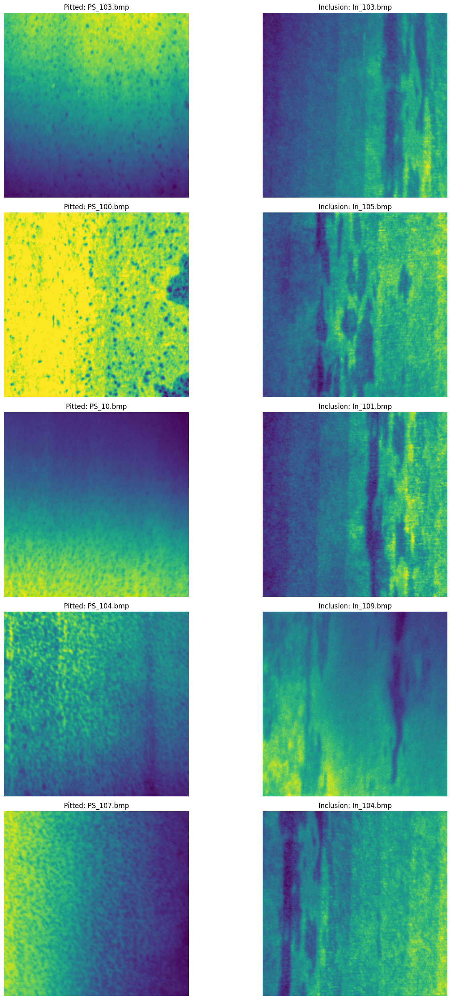

Visualizing Scratches vs Patches...


<Figure size 1200x800 with 0 Axes>

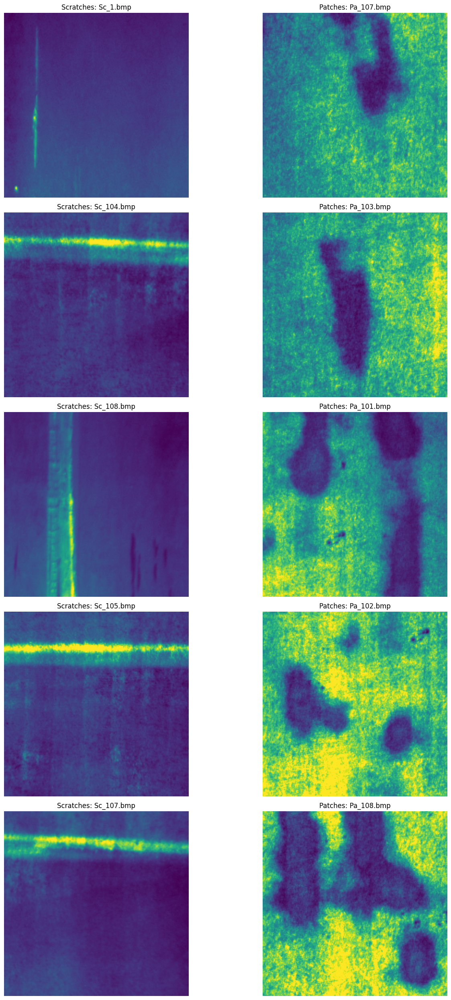

In [58]:

# Confused classes
confused_classes = [
    ("Pitted", "Inclusion"),
    ("Scratches", "Patches")
]

# Function to load a few images from each class
def load_images_for_visualization(directory, class1, class2, num_images=5):
    class1_dir = os.path.join(directory, class1)
    class2_dir = os.path.join(directory, class2)

    class1_images = [os.path.join(class1_dir, img) for img in os.listdir(class1_dir)[:num_images]]
    class2_images = [os.path.join(class2_dir, img) for img in os.listdir(class2_dir)[:num_images]]

    return class1_images, class2_images

# Visualize images side-by-side
def visualize_images(images1, images2, label1, label2):
    plt.figure(figsize=(12, 8))
    num_images = min(len(images1), len(images2))
    plt.figure(figsize=(15, num_images * 5))

    for i in range(num_images):
        # Load images
        img1 = Image.open(images1[i])
        img2 = Image.open(images2[i])

        # Plot side by side
        plt.subplot(num_images, 2, i * 2 + 1)
        plt.imshow(img1)
        plt.axis('off')
        plt.title(f"{label1}: {os.path.basename(images1[i])}")

        plt.subplot(num_images, 2, i * 2 + 2)
        plt.imshow(img2)
        plt.axis('off')
        plt.title(f"{label2}: {os.path.basename(images2[i])}")

    plt.tight_layout()
    plt.show()

# Visualize confused classes
for class1, class2 in confused_classes:
    print(f"Visualizing {class1} vs {class2}...")
    images1, images2 = load_images_for_visualization(test_dir, class1, class2, num_images=5)
    visualize_images(images1, images2, class1, class2)